In [4]:
#IMPORTANDO LIBRERIAS NECESARIAS
import pandas as pd
from sklearn import datasets, metrics

#SPLIT, MODELOS Y TIPOS DE VALIDACIONES CRUZADAS
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import RepeatedStratifiedKFold
# !pip install mlxtend
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

#METRICAS
from sklearn.metrics import confusion_matrix, precision_score, accuracy_score, recall_score, f1_score, roc_auc_score, roc_curve, classification_report

#GRAFICAR
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [5]:
df = pd.read_csv("cancer_mama.csv")

# A. DESCRIPCIÓN DE LA BASE DE DATOS

# PRE-PROCESAMIENTO

In [6]:
df.columns = ['ID number', 'Diagnosis', 'radius', 'texture', 'perimeter', 'area',
       'smoothness', 'compactness', 'concavity', 'concave points',
       'symmetry', 'fractal dimension']

In [7]:
df["Diagnosis"].replace("M", 1, inplace=True)
df["Diagnosis"].replace("B", 0, inplace=True)

In [8]:
#visualización
df.head()

,ID number,Diagnosis,radius,texture,perimeter,area,smoothness,compactness,concavity,concave points,symmetry,fractal dimension
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883


In [9]:
df.describe()

,ID number,Diagnosis,radius,texture,perimeter,area,smoothness,compactness,concavity,concave points,symmetry,fractal dimension
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,0.372583,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798
std,1.250206e+08,0.483918,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060
min,8.670000e+03,0.000000,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960
25%,8.692180e+05,0.000000,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700
50%,9.060240e+05,0.000000,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540
75%,8.813129e+06,1.000000,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120
max,9.113205e+08,1.000000,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ID number          569 non-null    int64  
 1   Diagnosis          569 non-null    int64  
 2   radius             569 non-null    float64
 3   texture            569 non-null    float64
 4   perimeter          569 non-null    float64
 5   area               569 non-null    float64
 6   smoothness         569 non-null    float64
 7   compactness        569 non-null    float64
 8   concavity          569 non-null    float64
 9   concave points     569 non-null    float64
 10  symmetry           569 non-null    float64
 11  fractal dimension  569 non-null    float64
dtypes: float64(10), int64(2)
memory usage: 53.5 KB


In [11]:
df.groupby("Diagnosis").count()

,ID number,radius,texture,perimeter,area,smoothness,compactness,concavity,concave points,symmetry,fractal dimension
Diagnosis,,,,,,,,,,,
0,357,357,357,357,357,357,357,357,357,357,357
1,212,212,212,212,212,212,212,212,212,212,212


In [12]:
df.groupby("Diagnosis").count() / df.groupby("Diagnosis").count().sum()

,ID number,radius,texture,perimeter,area,smoothness,compactness,concavity,concave points,symmetry,fractal dimension
Diagnosis,,,,,,,,,,,
0,0.627417,0.627417,0.627417,0.627417,0.627417,0.627417,0.627417,0.627417,0.627417,0.627417,0.627417
1,0.372583,0.372583,0.372583,0.372583,0.372583,0.372583,0.372583,0.372583,0.372583,0.372583,0.372583


In [13]:
df.isnull().sum()

ID number            0
Diagnosis            0
radius               0
texture              0
perimeter            0
area                 0
smoothness           0
compactness          0
concavity            0
concave points       0
symmetry             0
fractal dimension    0
dtype: int64

# ANALISIS

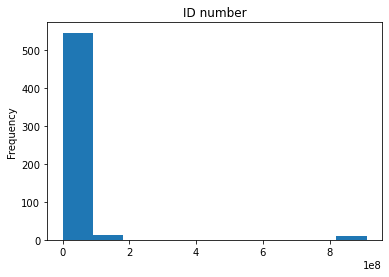

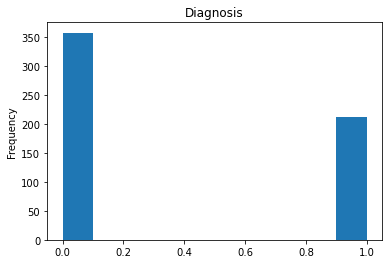

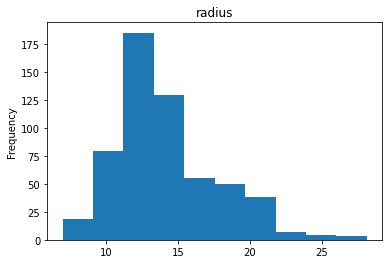

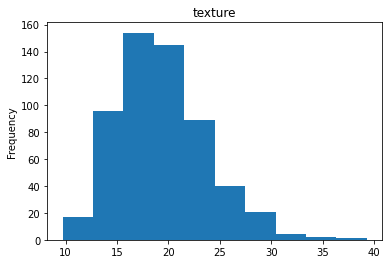

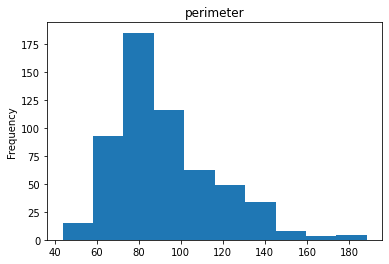

...

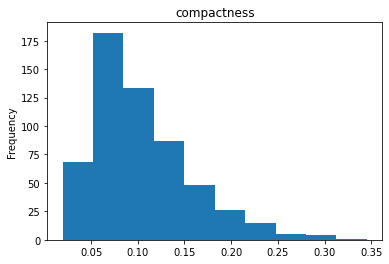

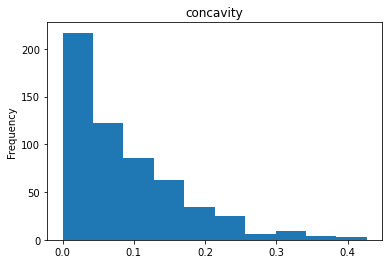

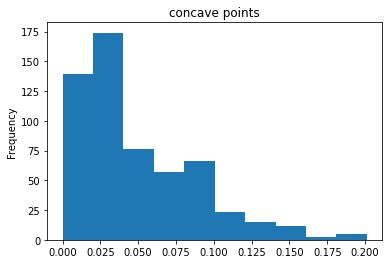

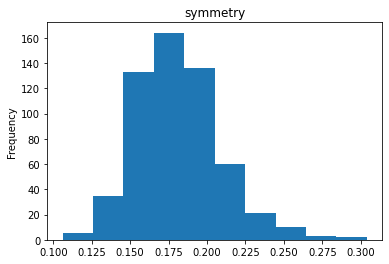

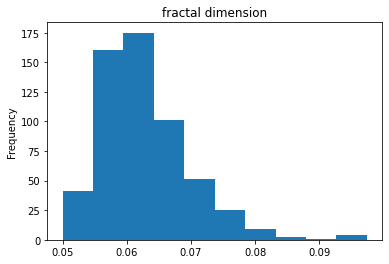

In [14]:
# HISTOGRAMAS
for column in df:
    plt.figure(column)
    plt.title(column)
    df[column].plot(kind = "hist")

<AxesSubplot:>

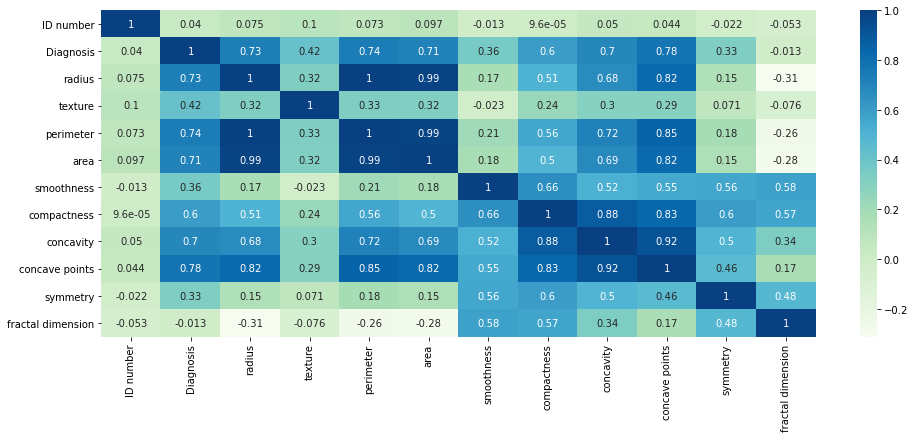

In [15]:
corr = df.corr()
plt.figure(figsize=(16, 6))
sns.heatmap(corr, cmap = "GnBu", annot=True)

<Figure size 1440x1440 with 0 Axes>

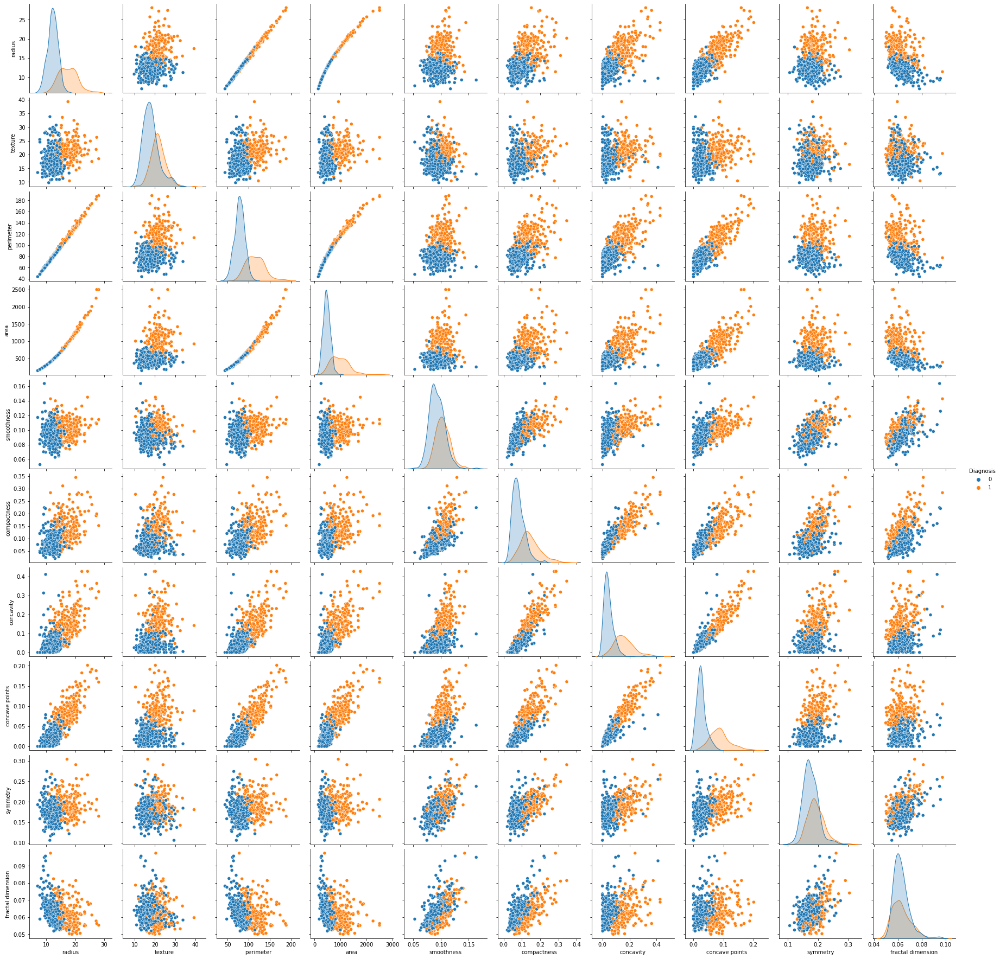

In [16]:
plt.figure(figsize=(20, 20))

sns.pairplot(df, 
        vars = ['radius', 'texture', 'perimeter', 'area',
       'smoothness', 'compactness', 'concavity', 'concave points',
       'symmetry', 'fractal dimension'], 
        height = 2.5,
        hue="Diagnosis")

# B. REGRESIÓN LOGÍSTICA

In [17]:
Y = df["Diagnosis"]
X = df.drop(columns=["ID number", "Diagnosis"])

In [18]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=12345)

In [19]:
Logit = LogisticRegression(solver='lbfgs', max_iter=1000, penalty="none")
Logit.fit(X_train, y_train)

LogisticRegression(max_iter=1000, penalty='none')

In [20]:
y_pred_m = Logit.predict(X_train)
metrics.accuracy_score(y_train, y_pred_m)

0.9547738693467337

In [21]:
Logit.score(X_train, y_train)

0.9547738693467337

## Evaluación

In [22]:
#EVALUACIÓN
y_pred = Logit.predict(X_test)
cf_Log = confusion_matrix(y_test, y_pred)
print(cf_Log)

VN, FP, FN, VP = confusion_matrix(y_test, y_pred).ravel()
print("Verdaderos negativos: ",VN)
print("Falsos Positivos: ",FP)
print("Falsos Negativos: ",FN)
print("Verdaderos Positivos: ",VP)


[[104   7]
 [  7  53]]
Verdaderos negativos:  104
Falsos Positivos:  7
Falsos Negativos:  7
Verdaderos Positivos:  53


In [23]:
#ACCURACY
metrics.accuracy_score(y_test, y_pred)

0.9181286549707602

In [24]:
#PRECISION
precision_score(y_test, y_pred)

0.8833333333333333

In [25]:
#RECALL
recall_score(y_test, y_pred)

0.8833333333333333

## Evaluación con validación cruzada

In [26]:
kf = KFold(n_splits=5, shuffle=True, random_state=12345)

In [27]:
scores = cross_val_score(Logit, X_train, y_train, cv=kf, scoring="accuracy")
print(scores, scores.mean())

[0.925      0.95       0.975      0.96202532 0.97468354] 0.9573417721518988


In [28]:
scores = cross_val_score(Logit, X_train, y_train, cv=kf, scoring="precision")
print(scores, scores.mean())

[0.84848485 1.         0.96428571 0.97297297 1.        ] 0.9571487071487071


In [29]:
scores = cross_val_score(Logit, X_train, y_train, cv=kf, scoring="recall")
print(scores, scores.mean())

[0.96551724 0.83333333 0.96428571 0.94736842 0.93939394] 0.9299797298889857


# C. AJUSTE LOGIT CON FORWARD, BACKWARD, STEPWISE

# FOWARD

## FORWARD: ACCURACY

In [30]:
FA = sfs(Logit,
           k_features=10,
           forward=True,
           floating=False,
           verbose=0,
           scoring='accuracy',
           cv=5)

# Perform SFFS
FA = FA.fit(X_train, y_train, custom_feature_names=X.columns)

In [31]:
# Dataframe
RFA = pd.DataFrame(FA.subsets_).transpose()
RFA

,feature_idx,cv_scores,avg_score,feature_names
1,"(7,)","[0.925, 0.9125, 0.95, 0.9367088607594937, 0.89...",0.924589,"(concave points,)"
2,"(1, 7)","[0.9375, 0.95, 0.975, 0.9493670886075949, 0.89...",0.94212,"(texture, concave points)"
3,"(1, 5, 7)","[0.9375, 0.9625, 0.975, 0.9620253164556962, 0....",0.947152,"(texture, compactness, concave points)"
4,"(1, 5, 7, 9)","[0.9375, 0.9625, 0.975, 0.9620253164556962, 0....",0.947152,"(texture, compactness, concave points, fractal..."
5,"(1, 4, 5, 7, 9)","[0.95, 0.9625, 0.975, 0.9620253164556962, 0.89...",0.949652,"(texture, smoothness, compactness, concave poi..."
6,"(0, 1, 4, 5, 7, 9)","[0.95, 0.95, 0.975, 0.9620253164556962, 0.9113...",0.949684,"(radius, texture, smoothness, compactness, con..."
7,"(0, 1, 2, 4, 5, 7, 9)","[0.95, 0.95, 0.9625, 0.9620253164556962, 0.898...",0.944652,"(radius, texture, perimeter, smoothness, compa..."
8,"(0, 1, 2, 4, 5, 6, 7, 9)","[0.9375, 0.95, 0.9625, 0.9620253164556962, 0.8...",0.942152,"(radius, texture, perimeter, smoothness, compa..."
9,"(0, 1, 2, 3, 4, 5, 6, 7, 9)","[0.925, 0.95, 0.95, 0.9746835443037974, 0.8987...",0.939684,"(radius, texture, perimeter, area, smoothness,..."
10,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9)","[0.9125, 0.95, 0.95, 0.9746835443037974, 0.898...",0.937184,"(radius, texture, perimeter, area, smoothness,..."


Aquí se muestra el dataframe con las variables más importnate en cada selección, el average_score (accuracy) dada la validación cruzada. En la siguiente linea se recogen en una lista las variables del modelo con mejor accuracy promedio. El mismo proceso se repitió para cada método de selección / métrica, con el fin de unificar los resultados en una tabla.

In [32]:
#VARIABLES WITH BEST RESULTV
VRFA = list(RFA[RFA["avg_score"]==RFA["avg_score"].max()].iloc[0]["feature_names"])
VRFA

['radius',
 'texture',
 'smoothness',
 'compactness',
 'concave points',
 'fractal dimension']

## FORWARD: PRECISION

In [33]:
FP = sfs(Logit,
           k_features=10,
           forward=True,
           floating=False,
           verbose=0,
           scoring='precision',
           cv=5);

# Perform SFFS
FP = FP.fit(X_train, y_train, custom_feature_names=X.columns);

# Dataframe
RFP = pd.DataFrame(FP.subsets_).transpose()

#VARIABLES WITH BEST RESULT
VRFP = list(RFP[RFP["avg_score"]==RFP["avg_score"].max()].iloc[0]["feature_names"])

C:\Users\War\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\War\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\War\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\War\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-d

## FORWARD: RECALL

In [34]:
FR = sfs(Logit,
           k_features=10,
           forward=True,
           floating=False,
           verbose=0,
           scoring='recall',
           cv=5)

# Perform SFFS
FR = FR.fit(X_train, y_train, custom_feature_names=X.columns)

# Dataframe
RFR = pd.DataFrame(FR.subsets_).transpose()

#VARIABLES WITH BEST RESULT
VRFR = list(RFR[RFR["avg_score"]==RFR["avg_score"].max()].iloc[0]["feature_names"])


## FORWARD: GRÁFICA

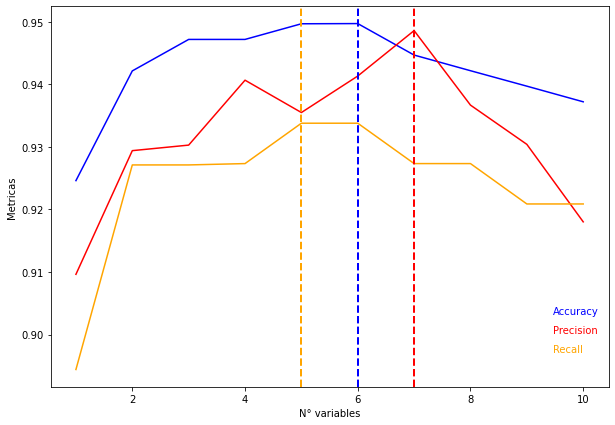

In [35]:
#GRÁFICA
fig, ax = plt.subplots(figsize=(10,7))
plt.plot(RFR.index, RFA["avg_score"], color='blue')
plt.plot(RFR.index, RFP["avg_score"], color='red')
plt.plot(RFR.index, RFR["avg_score"], color='orange')
plt.text(0.9, 0.2, 'Accuracy', horizontalalignment='left',verticalalignment='center', transform=ax.transAxes, color="blue")
plt.text(0.9, 0.15, 'Precision', horizontalalignment='left',verticalalignment='center', transform=ax.transAxes, color="red")
plt.text(0.9, 0.1, 'Recall', horizontalalignment='left',verticalalignment='center', transform=ax.transAxes, color="orange")
plt.xlabel("N° variables")
plt.ylabel("Metricas")
ax.axvline(RFA[RFA["avg_score"]==RFA["avg_score"].max()].index[0], color='blue', linestyle='--', lw=2)
ax.axvline(RFP[RFP["avg_score"]==RFP["avg_score"].max()].index[0], color='red', linestyle='--', lw=2)
ax.axvline(RFR[RFR["avg_score"]==RFR["avg_score"].max()].index[0], color='orange', linestyle='--', lw=2)

## FOWARD: MATRIZ DE CONFUSIÓN, PRECISION y RECALL DE LOS MODELOS ÓPTIMOS POR TIPO DE METRICA EVALUADA CON LA MUESTRA DE TESTEO

In [36]:
ctable = {}

In [37]:

for i,e,k in zip([VRFA, VRFP, VRFR], ['Accuracy', 'Precision', 'Recall'], ['VRFA', 'VRFP', 'VRFR'] ):
    Logit.fit(X_train[i], y_train)
    y_pred = Logit.predict(X_test[i])
    VN, FP, FN, VP = confusion_matrix(y_test, y_pred).ravel()

    print(f"Las variables escogidas con {e} son {i} ")
    print("Verdaderos negativos: ",VN)
    print("Falsos Positivos: ",FP)
    print("Falsos Negativos: ",FN)
    print("Verdaderos Positivos: ",VP)
    print(f"La Accuracy es: {accuracy_score(y_test, y_pred)}")
    print(f"La Precision es: {precision_score(y_test, y_pred)}")
    print(f"El Recall es: {recall_score(y_test, y_pred)} \n\n")
    
    ctable[f"{k}"] = [VN, FP, FN, VP, accuracy_score(y_test, y_pred), precision_score(y_test, y_pred), recall_score(y_test, y_pred) ]
    

Las variables escogidas con Accuracy son ['radius', 'texture', 'smoothness', 'compactness', 'concave points', 'fractal dimension'] 
Verdaderos negativos:  103
Falsos Positivos:  8
Falsos Negativos:  7
Verdaderos Positivos:  53
La Accuracy es: 0.9122807017543859
La Precision es: 0.8688524590163934
El Recall es: 0.8833333333333333 


Las variables escogidas con Precision son ['radius', 'texture', 'smoothness', 'concavity', 'concave points', 'symmetry', 'fractal dimension'] 
Verdaderos negativos:  104
Falsos Positivos:  7
Falsos Negativos:  7
Verdaderos Positivos:  53
La Accuracy es: 0.9181286549707602
La Precision es: 0.8833333333333333
El Recall es: 0.8833333333333333 


Las variables escogidas con Recall son ['radius', 'texture', 'smoothness', 'compactness', 'concave points'] 
Verdaderos negativos:  103
Falsos Positivos:  8
Falsos Negativos:  7
Verdaderos Positivos:  53
La Accuracy es: 0.9122807017543859
La Precision es: 0.8688524590163934
El Recall es: 0.8833333333333333 




# BACKWARD

## BACKWARD: ACCURACY

In [38]:
BA = sfs(Logit,
           k_features=1,
           forward=False,
           floating=False,
           verbose=0,
           scoring='accuracy',
           cv=5)

# Perform SFFS
BA = BA.fit(X_train, y_train, custom_feature_names=X.columns)

# Dataframe
RBA = pd.DataFrame(BA.subsets_).transpose()

#VARIABLES WITH BEST RESULTV
VRBA = list(RBA[RBA["avg_score"]==RBA["avg_score"].max()].iloc[-1]["feature_names"])

## BACKWARD: PRECISION

In [39]:
BP = sfs(Logit,
           k_features=1,
           forward=False,
           floating=False,
           verbose=0,
           scoring='precision',
           cv=5)

# Perform SFFS
BP = BP.fit(X_train, y_train, custom_feature_names=X.columns)

# Dataframe
RBP = pd.DataFrame(BP.subsets_).transpose()

#VARIABLES WITH BEST RESULTV
VRBP = list(RBP[RBP["avg_score"]==RBP["avg_score"].max()].iloc[-1]["feature_names"])

## BACKWARD: RECALL

In [40]:
BR = sfs(Logit,
           k_features=1,
           forward=False,
           floating=False,
           verbose=0,
           scoring='recall',
           cv=5)

# Perform SFFS
BR = BR.fit(X_train, y_train, custom_feature_names=X.columns)

# Dataframe
RBR = pd.DataFrame(BR.subsets_).transpose()

#VARIABLES WITH BEST RESULTV
VRBR = list(RBR[RBR["avg_score"]==RBR["avg_score"].max()].iloc[-1]["feature_names"])

## BACWARD: GRÁFICA

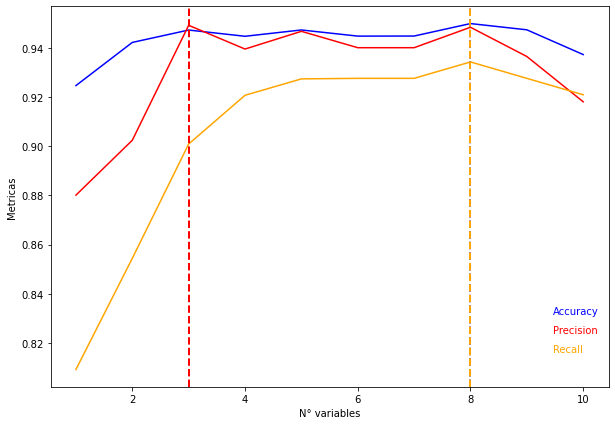

In [41]:
#GRÁFICA
fig, ax = plt.subplots(figsize=(10,7))
plt.plot(RBR.index, RBA["avg_score"], color='blue')
plt.plot(RBR.index, RBP["avg_score"], color='red')
plt.plot(RBR.index, RBR["avg_score"], color='orange')
plt.text(0.9, 0.2, 'Accuracy', horizontalalignment='left',verticalalignment='center', transform=ax.transAxes, color="blue")
plt.text(0.9, 0.15, 'Precision', horizontalalignment='left',verticalalignment='center', transform=ax.transAxes, color="red")
plt.text(0.9, 0.1, 'Recall', horizontalalignment='left',verticalalignment='center', transform=ax.transAxes, color="orange")
plt.xlabel("N° variables")
plt.ylabel("Metricas")
ax.axvline(RBA[RBA["avg_score"]==RBA["avg_score"].max()].index[-1], color='blue', linestyle='--', lw=2)
ax.axvline(RBP[RBP["avg_score"]==RBP["avg_score"].max()].index[-1], color='red', linestyle='--', lw=2)
ax.axvline(RBR[RBR["avg_score"]==RBR["avg_score"].max()].index[-1], color='orange', linestyle='--', lw=2)

In [42]:
for i,e,k in zip([VRBA, VRBP, VRBR], ['Accuracy', 'Precision', 'Recall'], ['VRBA', 'VRBP', 'VRBR']):
    Logit.fit(X_train[i], y_train)
    y_pred = Logit.predict(X_test[i])
    VN, BP, FN, VP = confusion_matrix(y_test, y_pred).ravel()
    print(f"Las variables escogidas con {e} son {i} ")
    print("Verdaderos negativos: ",VN)
    print("BAlsos Positivos: ",BP)
    print("BAlsos Negativos: ",FN)
    print("Verdaderos Positivos: ",VP)
    print(f"La Accuracy es: {metrics.accuracy_score(y_test, y_pred)}")
    print(f"La Precision es: {precision_score(y_test, y_pred)}")
    print(f"El Recall es: {recall_score(y_test, y_pred)} \n\n")

    ctable[f"{k}"] = [VN, FP, FN, VP, accuracy_score(y_test, y_pred), precision_score(y_test, y_pred), recall_score(y_test, y_pred) ]

Las variables escogidas con Accuracy son ['radius', 'texture', 'perimeter', 'area', 'compactness', 'concavity', 'concave points', 'symmetry'] 
Verdaderos negativos:  102
BAlsos Positivos:  9
BAlsos Negativos:  7
Verdaderos Positivos:  53
La Accuracy es: 0.9064327485380117
La Precision es: 0.8548387096774194
El Recall es: 0.8833333333333333 


Las variables escogidas con Precision son ['radius', 'texture', 'symmetry'] 
Verdaderos negativos:  100
BAlsos Positivos:  11
BAlsos Negativos:  9
Verdaderos Positivos:  51
La Accuracy es: 0.8830409356725146
La Precision es: 0.8225806451612904
El Recall es: 0.85 


Las variables escogidas con Recall son ['radius', 'texture', 'perimeter', 'area', 'smoothness', 'concavity', 'concave points', 'symmetry'] 
Verdaderos negativos:  103
BAlsos Positivos:  8
BAlsos Negativos:  6
Verdaderos Positivos:  54
La Accuracy es: 0.9181286549707602
La Precision es: 0.8709677419354839
El Recall es: 0.9 




# STEPWISE

## STEPWISE: ACCURACY

In [43]:
SA = sfs(Logit,
           k_features=10,
           forward=True,
           floating=True,
           verbose=0,
           scoring='accuracy',
           cv=5)

# Perform SFFS
SA = SA.fit(X_train, y_train, custom_feature_names=X.columns)

# Dataframe
RSA = pd.DataFrame(SA.subsets_).transpose()

#VARIABLES WITH BEST RESULTV
VRSA = list(RSA[RSA["avg_score"]==RSA["avg_score"].max()].iloc[0]["feature_names"])

## STEPWISE: PRECISION

In [44]:
SP = sfs(Logit,
           k_features=10,
           forward=True,
           floating=True,
           verbose=0,
           scoring='precision',
           cv=5);

# Perform SFFS
SP = SP.fit(X_train, y_train, custom_feature_names=X.columns);

# Dataframe
RSP = pd.DataFrame(SP.subsets_).transpose()

#VARIABLES WITH BEST RESULT
VRSP = list(RSP[RSP["avg_score"]==RSP["avg_score"].max()].iloc[0]["feature_names"])

C:\Users\War\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\War\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\War\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\War\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-d

## STEPWISE: RECALL

In [45]:
SR = sfs(Logit,
           k_features=10,
           forward=True,
           floating=True,
           verbose=0,
           scoring='recall',
           cv=5)

# Perform SFFS
SR = SR.fit(X_train, y_train, custom_feature_names=X.columns)

# DataSRame
RSR = pd.DataFrame(SR.subsets_).transpose()

#VARIABLES WITH BEST RESULT
VRSR = list(RSR[RSR["avg_score"]==RSR["avg_score"].max()].iloc[0]["feature_names"])

## STEPWISE: GRÁFICA

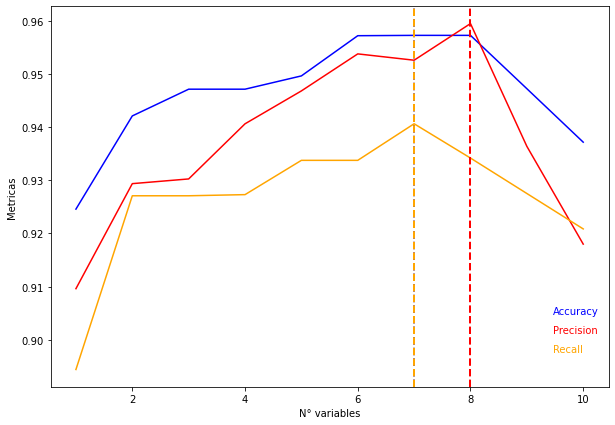

In [46]:
#GRÁFICA
fig, ax = plt.subplots(figsize=(10,7))
plt.plot(RSR.index, RSA["avg_score"], color='blue')
plt.plot(RSR.index, RSP["avg_score"], color='red')
plt.plot(RSR.index, RSR["avg_score"], color='orange')
plt.text(0.9, 0.2, 'Accuracy', horizontalalignment='left',verticalalignment='center', transform=ax.transAxes, color="blue")
plt.text(0.9, 0.15, 'Precision', horizontalalignment='left',verticalalignment='center', transform=ax.transAxes, color="red")
plt.text(0.9, 0.1, 'Recall', horizontalalignment='left',verticalalignment='center', transform=ax.transAxes, color="orange")
plt.xlabel("N° variables")
plt.ylabel("Metricas")
ax.axvline(RSA[RSA["avg_score"]==RSA["avg_score"].max()].index[0], color='blue', linestyle='--', lw=2)
ax.axvline(RSP[RSP["avg_score"]==RSP["avg_score"].max()].index[0], color='red', linestyle='--', lw=2)
ax.axvline(RSR[RSR["avg_score"]==RSR["avg_score"].max()].index[0], color='orange', linestyle='--', lw=2)

STEPWISE: MATRIZ DE CONFUSIÓN, PRECISION y RECALL DE LOS MODELOS ÓPTIMOS POR TIPO DE METRICA EVALUADA CON LA MUESTRA DE TESTEO

In [47]:
for i,e,k in zip([VRSA, VRSP, VRSR], ['Accuracy', 'Precision', 'Recall'], ["VRSA", "VRSP", "VRSR"]):
    Logit.fit(X_train[i], y_train)
    y_pred = Logit.predict(X_test[i])
    VN, SP, FN, VP = confusion_matrix(y_test, y_pred).ravel()
    print(f"Las variables escogidas con {e} son {i} ")
    print("Verdaderos negativos: ",VN)
    print("Falsos Positivos: ",SP)
    print("Falsos Negativos: ",FN)
    print("Verdaderos Positivos: ",VP)
    print(f"La Accuracy es: {metrics.accuracy_score(y_test, y_pred)}")
    print(f"La Precision es: {precision_score(y_test, y_pred)}")
    print(f"El Recall es: {recall_score(y_test, y_pred)} \n\n")

    ctable[f"{k}"] = [VN, FP, FN, VP, accuracy_score(y_test, y_pred), precision_score(y_test, y_pred), recall_score(y_test, y_pred) ]

Las variables escogidas con Accuracy son ['radius', 'texture', 'smoothness', 'concavity', 'concave points', 'symmetry', 'fractal dimension'] 
Verdaderos negativos:  104
Falsos Positivos:  7
Falsos Negativos:  7
Verdaderos Positivos:  53
La Accuracy es: 0.9181286549707602
La Precision es: 0.8833333333333333
El Recall es: 0.8833333333333333 


Las variables escogidas con Precision son ['texture', 'perimeter', 'area', 'smoothness', 'concavity', 'concave points', 'symmetry', 'fractal dimension'] 
Verdaderos negativos:  101
Falsos Positivos:  10
Falsos Negativos:  6
Verdaderos Positivos:  54
La Accuracy es: 0.9064327485380117
La Precision es: 0.84375
El Recall es: 0.9 


Las variables escogidas con Recall son ['radius', 'texture', 'smoothness', 'concavity', 'concave points', 'symmetry', 'fractal dimension'] 
Verdaderos negativos:  104
Falsos Positivos:  7
Falsos Negativos:  7
Verdaderos Positivos:  53
La Accuracy es: 0.9181286549707602
La Precision es: 0.8833333333333333
El Recall es: 0.883

In [48]:
tablamodelos = pd.DataFrame(ctable, index=[ "VN", "FP", "FN", "VP", "AS", "PS", "RS"])
tablamodelos.to_excel("tabla_modelos.xlsx")

In [49]:
tablamodelos

,VRFA,VRFP,VRFR,VRBA,VRBP,VRBR,VRSA,VRSP,VRSR
VN,103.000000,104.000000,103.000000,102.000000,100.000000,103.000000,104.000000,101.000000,104.000000
FP,8.000000,7.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000
FN,7.000000,7.000000,7.000000,7.000000,9.000000,6.000000,7.000000,6.000000,7.000000
VP,53.000000,53.000000,53.000000,53.000000,51.000000,54.000000,53.000000,54.000000,53.000000
AS,0.912281,0.918129,0.912281,0.906433,0.883041,0.918129,0.918129,0.906433,0.918129
PS,0.868852,0.883333,0.868852,0.854839,0.822581,0.870968,0.883333,0.843750,0.883333
RS,0.883333,0.883333,0.883333,0.883333,0.850000,0.900000,0.883333,0.900000,0.883333


In [50]:
a = {}       
b = list(X.columns)
c = [VRFA, VRFP, VRFR, VRBA, VRBP, VRBR, VRSA, VRSP, VRSR]
d = ['VRFA', 'VRFP', 'VRFR', 'VRBA', 'VRBP', 'VRBR', 'VRSA', 'VRSP', 'VRSR']

In [51]:
for i in d:
    a[i] = [0,0,0,0,0,0,0,0,0,0] 

In [52]:
for i in b:
    for e,k in zip(c,d):
        if i in e:
            a[k][b.index(i)] = 1

In [53]:
pd.DataFrame(a, index = X.columns).to_excel("tabla_modelos_variables.xlsx")

# E. LASSO Y RIDGE EN CLASIFICACIÓN -LOGIT

# Ridge

In [54]:
lambdas = np.linspace(0.01, 10, 30)

In [55]:
LR = LogisticRegressionCV(cv=5, random_state=12345, penalty = "l2", solver = "lbfgs", Cs = lambdas, max_iter=1000)
LR.fit(X_train, y_train)

LogisticRegressionCV(Cs=array([ 0.01      ,  0.35448276,  0.69896552,  1.04344828,  1.38793103,
        1.73241379,  2.07689655,  2.42137931,  2.76586207,  3.11034483,
        3.45482759,  3.79931034,  4.1437931 ,  4.48827586,  4.83275862,
        5.17724138,  5.52172414,  5.8662069 ,  6.21068966,  6.55517241,
        6.89965517,  7.24413793,  7.58862069,  7.93310345,  8.27758621,
        8.62206897,  8.96655172,  9.31103448,  9.65551724, 10.        ]),
                     cv=5, max_iter=1000, random_state=12345)

In [56]:
y_pred_R = LR.predict(X_test)

In [57]:
cf_Log_R = confusion_matrix(y_test, y_pred_R)
print(cf_Log_R)

VN_R, FP_R, FN_R, VP_R = confusion_matrix(y_test, y_pred_R).ravel()
print("Verdaderos negativos: ",VN_R)
print("Falsos Positivos: ",FP_R)
print("Falsos Negativos: ",FN_R)
print("Verdaderos Positivos: ",VP_R)

[[105   6]
 [  8  52]]
Verdaderos negativos:  105
Falsos Positivos:  6
Falsos Negativos:  8
Verdaderos Positivos:  52


In [58]:
metrics.accuracy_score(y_test, y_pred_R)

0.9181286549707602

In [59]:
precision_score(y_test, y_pred_R)

0.896551724137931

In [60]:
recall_score(y_test, y_pred_R)

0.8666666666666667

In [61]:
LR.coef_ 

array([[-5.09733381,  0.20264655,  0.76974658,  0.01114016,  1.74157169,
         1.74168689,  3.90613799,  2.56262338,  2.08267375,  0.2507539 ]])

## LASSO

In [62]:
LL = LogisticRegressionCV(cv=5, random_state=12345, solver = "liblinear",  penalty = "l1", Cs = lambdas, max_iter=1000)
LL.fit(X_train, y_train)

LogisticRegressionCV(Cs=array([ 0.01      ,  0.35448276,  0.69896552,  1.04344828,  1.38793103,
        1.73241379,  2.07689655,  2.42137931,  2.76586207,  3.11034483,
        3.45482759,  3.79931034,  4.1437931 ,  4.48827586,  4.83275862,
        5.17724138,  5.52172414,  5.8662069 ,  6.21068966,  6.55517241,
        6.89965517,  7.24413793,  7.58862069,  7.93310345,  8.27758621,
        8.62206897,  8.96655172,  9.31103448,  9.65551724, 10.        ]),
                     cv=5, max_iter=1000, penalty='l1', random_state=12345,
                     solver='liblinear')

In [63]:
y_pred_L = LL.predict(X_test)

In [64]:
cf_Log_L = confusion_matrix(y_test, y_pred_L)
print(cf_Log_L)

VN_L, FP_L, FN_L, VP_L = confusion_matrix(y_test, y_pred_L).ravel()
print("Verdaderos negativos: ",VN_L)
print("Falsos Positivos: ",FP_L)
print("Falsos Negativos: ",FN_L)
print("Verdaderos Positivos: ",VP_L)

[[104   7]
 [  7  53]]
Verdaderos negativos:  104
Falsos Positivos:  7
Falsos Negativos:  7
Verdaderos Positivos:  53


In [65]:
metrics.accuracy_score(y_test, y_pred_L)

0.9181286549707602

In [66]:
precision_score(y_test, y_pred_L)

0.8833333333333333

In [67]:
recall_score(y_test, y_pred_L)

0.8833333333333333

In [68]:
LL.coef_

array([[-1.30784580e+00,  2.53454912e-01, -1.58237919e-01,
         3.53493706e-02,  3.06482713e+00,  0.00000000e+00,
         1.29151886e+01,  7.37782202e+01,  3.32527714e+00,
         0.00000000e+00]])

In [69]:
X.columns

Index(['radius', 'texture', 'perimeter', 'area', 'smoothness', 'compactness',
       'concavity', 'concave points', 'symmetry', 'fractal dimension'],
      dtype='object')